In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D
%config InlineBackend.figure_formats = ['svg']

# Задача 1
## Кластеризция числовых данных. Метод: BIRCH

Группы точек:

- Точки вида (a, b + 0.5, aε), где значения a, b, ε — независимые случайные числа, равномерно распределённые на отрезке [−1, 1]
- Точки вида (a, b, −0.5+bε), где значения a, b, ε — независимые случайные числа, нормально распределённые
со средним значением 0 и среднеквадратическим отклонением 0.5

In [2]:
# Генерируем точки выборки

def generate_samples(N=1000):

    a1 = 2*np.random.rand(N)-1
    b1 = 2*np.random.rand(N)-1
    epsilon1 = 2*np.random.rand(N)-1
    group1 = np.vstack((a1, b1+0.5, a1*epsilon1)).T

    a2 = np.random.normal(0, 0.5, N)
    b2 = np.random.normal(0, 0.5, N)
    epsilon2 = np.random.normal(0, 0.5, N)
    group2 = np.vstack((a2, b2, b2*epsilon1-0.5)).T
    return group1, group2

def create_points(group1, group2):

    N1 = len(group1)
    N2 = len(group2)
    class_ids = np.hstack((np.zeros(N1), np.ones(N2)))
    points = np.concatenate((group1, group2), axis=0)
    return points, class_ids

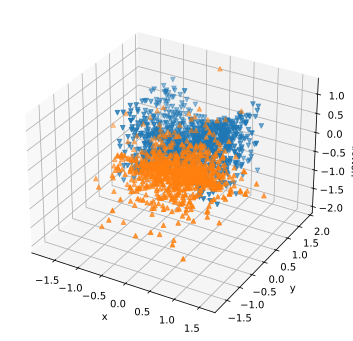

In [3]:
group1, group2 = generate_samples()


# Изобразим полученные точки на графике
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(projection='3d')
ax.scatter(group1[:,0], group1[:,1], group1[:, 2], 'b', marker='v')
ax.scatter(group2[:,0], group2[:,1], group2[:, 2], 'r', marker='^')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('номер класса')
plt.show()

In [15]:
# Проведем кластеризацию точек с использованием метода BIRCH
from sklearn.cluster import Birch
from sklearn.metrics import classification_report

points, class_ids = create_points(group1, group2)
brc = Birch(n_clusters=2)
brc.fit(points)

Birch(n_clusters=2)

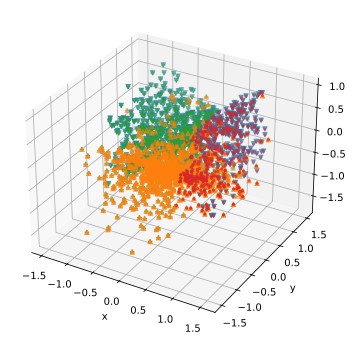

In [16]:
mask = brc.predict(points)
cluster1 = points[mask==0]
cluster2 = points[mask==1]
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(projection='3d')
ax.scatter(group1[:,0], group1[:,1], group1[:, 2], 'b', marker='v')
ax.scatter(group2[:,0], group2[:,1], group2[:, 2], 'r', marker='^')
ax.scatter(cluster1[:,0], cluster1[:,1], cluster1[:, 2], 'm', marker='+')
ax.scatter(cluster2[:,0], cluster2[:,1], cluster2[:, 2], 'k', marker='.')
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.show()

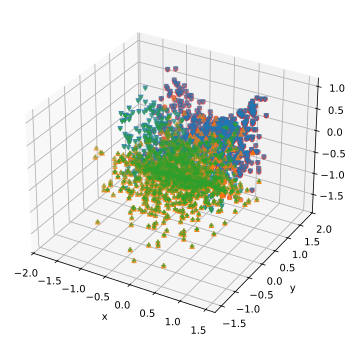

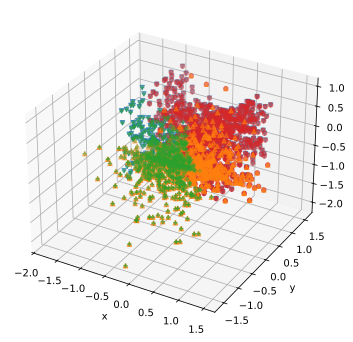

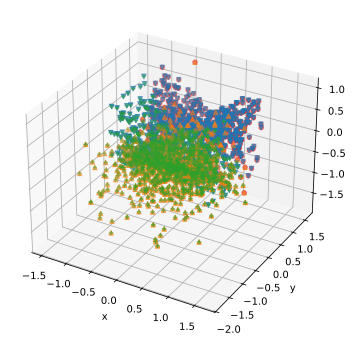

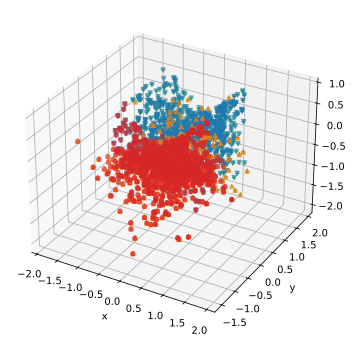

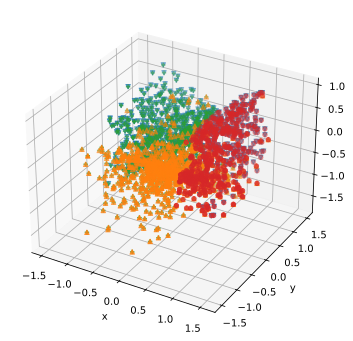

precisions =  [0.24012638 0.3557047  0.26645768 0.69912211 0.35750422]
recalls =  [0.152 0.424 0.17  0.876 0.212]


In [6]:
# Выполним обучение на данной выборке несколько раз и посмотрим на устойчивость данного метода кластеризации
NE = 5
precisions = np.empty(NE)
recalls = np.empty(NE)
for e_num in range(NE):
    group1, group2 = generate_samples()
    points, class_ids = create_points(group1, group2)
    brc = Birch(n_clusters=2)
    brc.fit(points)
    classes_predicted = brc.predict(points)
    rep_test = classification_report(class_ids, classes_predicted, output_dict=True, zero_division=0.0)
    # выберем из результатов precision и recall для класса 1
    precisions[e_num] = rep_test['1.0']['precision']
    recalls[e_num] = rep_test['1.0']['recall']
    cluster1 = points[classes_predicted==0]
    cluster2 = points[classes_predicted==1]
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(projection='3d')
    ax.scatter(group1[:,0], group1[:,1], group1[:, 2], 'b', marker='v')
    ax.scatter(group2[:,0], group2[:,1], group2[:, 2], 'r', marker='^')
    ax.scatter(cluster1[:,0], cluster1[:,1], cluster1[:, 2], 'm', marker='+')
    ax.scatter(cluster2[:,0], cluster2[:,1], cluster2[:, 2], 'k', marker='o')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    plt.show()

print('precisions = ', precisions)
print('recalls = ', recalls)

Заметим, что данный метод не устойчив и может дывать различные результаты кластеризации при разных занчениях генератора случайных чисел. Так же метод не всегда разделяет точки по изначально распределенным выборкам.

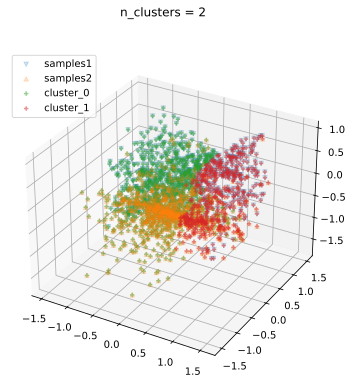

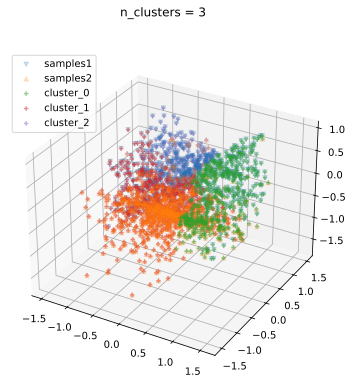

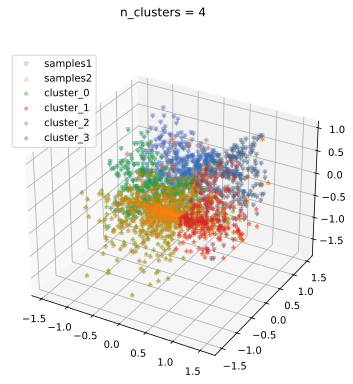

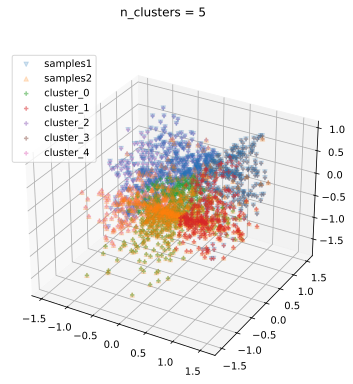

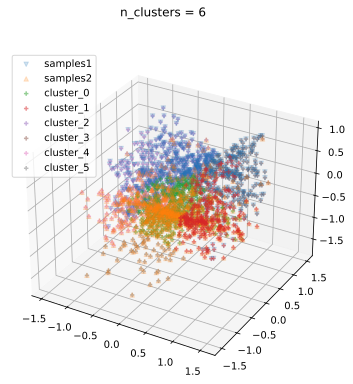

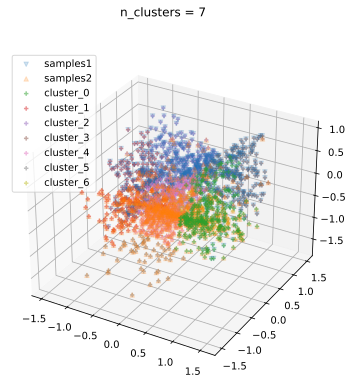

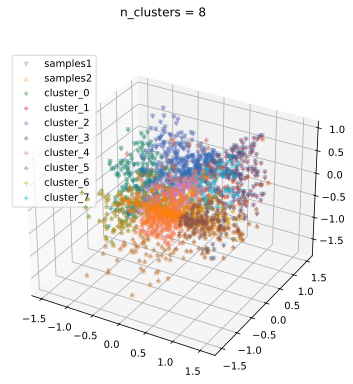

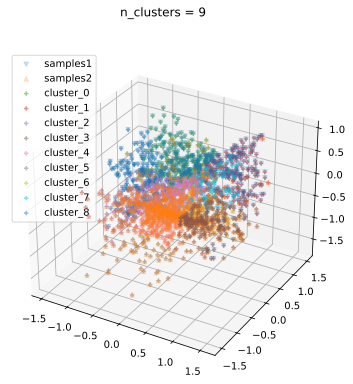

In [7]:
# Выполним кластеризацию с изменением числа класетров
for cluster_count in range(2, 10):
    brc = Birch(n_clusters=cluster_count)
    brc.fit(points)
    fig = plt.figure(figsize=(8, 6))
    fig.suptitle(f"n_clusters = {cluster_count}")
    ax = fig.add_subplot(projection='3d')
    ax.scatter(group1[:,0], group1[:,1], group1[:, 2], 'b', marker='v', label='samples1', alpha=0.2)
    ax.scatter(group2[:,0], group2[:,1], group2[:, 2], 'r', marker='^', label="samples2", alpha=0.2)
    mask = brc.predict(points)
    for i in range(cluster_count):
        cluster_i = points[mask==i]
        ax.scatter(cluster_i[:, 0], cluster_i[:, 1], cluster_i[:, 2],marker='+', alpha=0.5, label=f'cluster_{i}')
    ax.legend(loc=2)
    plt.show()

# Задача 2
Необходимо провести класстеризацию рецептов кондитерских изделий и изделий из мяса или рыбы


Заметим, что при извлечении численных признаков метод TF-IDF дает наилучший результат, изменим файлы(meet2, meet4), чтобы максимизировать угадывание при использовании этого метода векторизации. Тогда при использовании TF-IDF происходит верная кластеризация обучающей выборки


In [11]:
from os import listdir
from os.path import isfile, join
import numpy as np
input_files = sorted([f for f in listdir('text_clustering') if isfile(join('text_clustering', f))])
class_ids = np.hstack((np.zeros(10), np.ones(10)))
print(class_ids)
print(input_files)

from sklearn.cluster import Birch
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer


count_vect = CountVectorizer(input='filename')
# рассчитываем признаки, выводим их количество
files = ['./text_clustering/'+ f for f in input_files]
def cluster_by_vectorizer(vect, files):
    print(vect.__name__)
    count_vect = vect(input='filename')
    X_train_counts = count_vect.fit_transform(files)
    print(X_train_counts.shape)
    brc = Birch(n_clusters=2)
    # кластеризуем данные по признакам, выводим ярлыки
    result = brc.fit(X_train_counts)
    predict = brc.predict(X_train_counts)
    print(predict)
    print("1st cluster:")
    cluster1 = [f for i,f in enumerate(input_files) if predict[i] == 0]
    print(cluster1)
    print("2nd cluster:")
    cluster2 = [f for i,f in enumerate(input_files) if predict[i] == 1]
    print(cluster2)

cluster_by_vectorizer(CountVectorizer, files)
"""
[0 0 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0]
1st cluster:
['confectionery1.txt', 'confectionery10.txt', 'confectionery2.txt', 'confectionery3.txt', 'confectionery5.txt', 'confectionery7.txt', 'confectionery8.txt', 'meet1.txt', 'meet10.txt', 'meet2.txt', 'meet4.txt', 'meet5.txt', 'meet6.txt', 'meet7.txt', 'meet8.txt', 'meet9.txt']
2nd cluster:
['confectionery4.txt', 'confectionery6.txt', 'confectionery9.txt', 'meet3.txt']
"""
#print()
cluster_by_vectorizer(TfidfVectorizer, files)
"""[0 0 0 0 0 0 0 0 0 0 1 1 0 1 0 1 1 1 1 1]
1st cluster:
['confectionery1.txt', 'confectionery10.txt', 'confectionery2.txt', 'confectionery3.txt', 'confectionery4.txt', 'confectionery5.txt', 'confectionery6.txt', 'confectionery7.txt', 'confectionery8.txt', 'confectionery9.txt', 'meet2.txt', 'meet4.txt']
2nd cluster:
['meet1.txt', 'meet10.txt', 'meet3.txt', 'meet5.txt', 'meet6.txt', 'meet7.txt', 'meet8.txt', 'meet9.txt']
"""
#print()
cluster_by_vectorizer(HashingVectorizer, files)
"""1st cluster:
['confectionery10.txt', 'confectionery2.txt', 'confectionery3.txt', 'confectionery4.txt', 'confectionery5.txt', 'confectionery6.txt', 'confectionery7.txt', 'confectionery8.txt', 'confectionery9.txt', 'meet1.txt', 'meet10.txt', 'meet2.txt', 'meet3.txt', 'meet4.txt', 'meet5.txt', 'meet6.txt', 'meet7.txt', 'meet8.txt', 'meet9.txt']
2nd cluster:
['confectionery1.txt']"""
print()
"""
Заметим, что при извлечении численных признаков метод TF-IDF дает наилучший результат, изменим файлы(meet2, meet4), чтобы максимизировать угадывание при использовании этого метода векторизации. Тогда при использовании TF-IDF происходит верная кластеризация обучающей выборки

"""

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
['confectionery1.txt', 'confectionery10.txt', 'confectionery2.txt', 'confectionery3.txt', 'confectionery4.txt', 'confectionery5.txt', 'confectionery6.txt', 'confectionery7.txt', 'confectionery8.txt', 'confectionery9.txt', 'meet1.txt', 'meet10.txt', 'meet2.txt', 'meet3.txt', 'meet4.txt', 'meet5.txt', 'meet6.txt', 'meet7.txt', 'meet8.txt', 'meet9.txt']
CountVectorizer
(20, 612)
[1 1 1 0 0 1 0 0 1 0 1 1 1 0 0 1 0 1 1 1]
1st cluster:
['confectionery3.txt', 'confectionery4.txt', 'confectionery6.txt', 'confectionery7.txt', 'confectionery9.txt', 'meet3.txt', 'meet4.txt', 'meet6.txt']
2nd cluster:
['confectionery1.txt', 'confectionery10.txt', 'confectionery2.txt', 'confectionery5.txt', 'confectionery8.txt', 'meet1.txt', 'meet10.txt', 'meet2.txt', 'meet5.txt', 'meet7.txt', 'meet8.txt', 'meet9.txt']
TfidfVectorizer
(20, 612)
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
1st cluster:
['confectionery1.txt', 'confectionery10.txt', 'confectio

'\nЗаметим, что при извлечении численных признаков метод TF-IDF дает наилучший результат, изменим файлы(meet2, meet4), чтобы максимизировать угадывание при использовании этого метода векторизации. Тогда при использовании TF-IDF происходит верная кластеризация обучающей выборки\n\n'